### Problem

Misdiagnosis of the many diseases impacting agricultural crops can lead to misuse of chemicals leading to the emergence of resistant pathogen strains, increased input costs, and more outbreaks with significant economic loss and environmental impacts. Current disease diagnosis based on human scouting is time-consuming and expensive, and although computer-vision based models have the promise to increase efficiency, the great variance in symptoms due to age of infected tissues, genetic variations, and light conditions within trees decreases the accuracy of detection.

In this notebook I will do some exploratory analysisis and model predictions with the train and test data provided

https://www.kaggle.com/c/plant-pathology-2020-fgvc7

In [1]:
import os
import gc
import re

import cv2
import math
import numpy as np
import scipy as sp
import pandas as pd

import tensorflow as tf
from IPython.display import SVG
import efficientnet.tfkeras as efn
from keras.utils import plot_model
import tensorflow.keras.layers as L
from keras.utils import model_to_dot
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet121

import seaborn as sns
from tqdm import tqdm
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

tqdm.pandas()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

np.random.seed(0)
tf.random.set_seed(0)

import warnings
warnings.filterwarnings("ignore")

Using TensorFlow backend.
/home/carcrupe/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/home/carcrupe/anaconda3/lib/python3.7/site-packages/tqdm/std.py:648: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [56]:
EPOCHS = 10
SAMPLE_LEN = 100
IMAGE_PATH = "../../../dataSets/plant_pathology_images/images/"
TEST_PATH = "test.csv"
TRAIN_PATH = "train.csv"
SUB_PATH = "sample_submission.csv"

In [57]:
script_dir = os.path.dirname('/home/carcrupe/repo/') 
rel_path = "dataSets/plant_pathology_images/images/"
abs_file_path = os.path.join(script_dir, rel_path)

In [58]:
sub = pd.read_csv(SUB_PATH)
test_data = pd.read_csv(TEST_PATH)
train_data = pd.read_csv(TRAIN_PATH)

In [59]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [60]:
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(abs_file_path + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = train_data["image_id"][:SAMPLE_LEN].progress_apply(load_image)
test_images = test_data["image_id"][:10].progress_apply(load_image)

100%|██████████| 10/10 [00:00<00:00, 27.49it/s]


In [30]:
train_images[0].shape

(1365, 2048, 3)

In [8]:
fig = px.imshow(cv2.resize(train_images[0], (205, 136)))
fig.show()

The green parts of the image have very low blue values, but by contrast, the brown parts have high blue values. This might indicate when the leaf is healthy or not.

In [9]:
red_values = [np.mean(train_images[idx][:, :, 0]) for idx in range(len(train_images))]
green_values = [np.mean(train_images[idx][:, :, 1]) for idx in range(len(train_images))]
blue_values = [np.mean(train_images[idx][:, :, 2]) for idx in range(len(train_images))]
values = [np.mean(train_images[idx]) for idx in range(len(train_images))]

In [10]:
fig = ff.create_distplot([values], group_labels=["Channels"], colors=["black"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Distribution of channel values")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

We see that the average of all channels is aroung 105, being the maximum 255. This means, most of the pixels are less than half the range. Let´s have a look at the RGB channels separately.

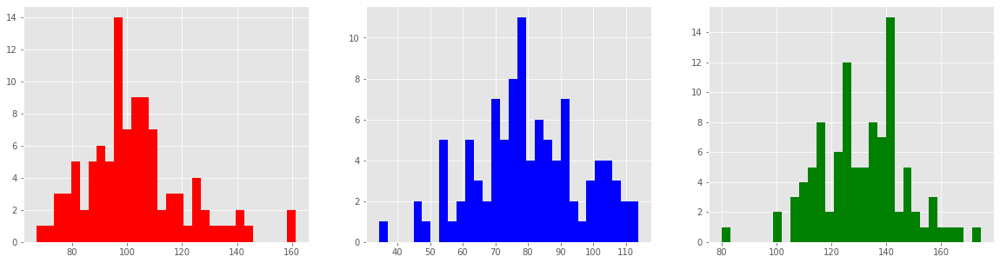

In [11]:
fig_plt,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(20,5))

ax1.hist(red_values, color='red', bins=30);
ax2.hist(blue_values, color='blue', bins=30);
ax3.hist(green_values, color='green', bins=30);

In [12]:
fig = go.Figure()
for idx, values in enumerate([red_values, green_values, blue_values]):
    if idx == 0:
        color = "Red"
    if idx == 1:
        color = "Green"
    if idx == 2:
        color = "Blue"
    fig.add_trace(go.Box(x=[color]*len(values), y=values, name=color, marker=dict(color=color.lower())))
    
fig.update_layout(yaxis_title="Mean value", xaxis_title="Color channel",
               title="Mean value vs. Color channel", template="plotly_white")

In [13]:
fig = ff.create_distplot([red_values, green_values, blue_values],
                         group_labels=["R", "G", "B"],
                         colors=["red", "green", "blue"])
fig.update_layout(title_text="Distribution of red channel values", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.data[1].marker.line.color = 'rgb(0, 0, 0)'
fig.data[1].marker.line.width = 0.5
fig.data[2].marker.line.color = 'rgb(0, 0, 0)'
fig.data[2].marker.line.width = 0.5
fig

From the graph above we can clearly see which channel is more prominent in the pictures. Let us visualize one picture for each category.

In [14]:
train_data.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


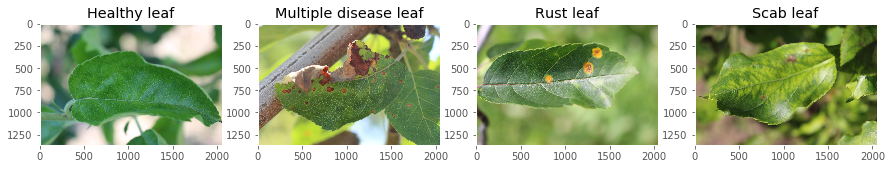

In [15]:
healthy_ids = train_data[train_data['healthy']==1].index
multiple_disease_ids = train_data[train_data['multiple_diseases']==1].index
rust_ids = train_data[train_data['rust']==1].index
scab_ids = train_data[train_data['scab']==1].index

fig, (ax1,ax2,ax3,ax4)= plt.subplots(1,4,figsize=(15,10))
ax1.imshow(train_images[healthy_ids[0]])
ax1.set_title('Healthy leaf')
ax1.grid(False)
ax2.imshow(train_images[multiple_disease_ids[0]])
ax2.set_title('Multiple disease leaf')
ax2.grid(False)
ax3.imshow(train_images[rust_ids[0]])
ax3.set_title('Rust leaf')
ax3.grid(False)
ax4.imshow(train_images[scab_ids[0]])
ax4.set_title('Scab leaf')
ax4.grid(False)

In [16]:
fig = go.Figure([go.Pie(labels=train_data.columns[1:],
           values=train_data.iloc[:, 1:].sum().values)])
fig.update_layout(title_text="Pie chart of targets", template="simple_white")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig.show()

Text(0.5, 1.0, 'Multiple disease distribution')

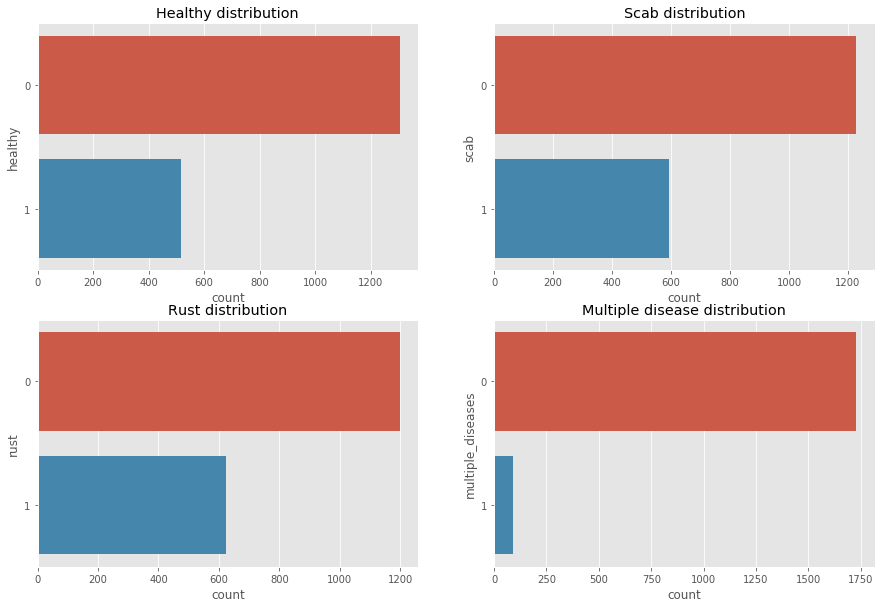

In [17]:
plt.subplots(2,2,figsize=(15,10))

plt.subplot(221)
ax1 = sns.countplot(data=train_data, y='healthy')
ax1.set_title('Healthy distribution')
plt.subplot(222)
ax2 = sns.countplot(data=train_data, y='scab')
ax2.set_title('Scab distribution')
plt.subplot(223)
ax3 = sns.countplot(data=train_data, y='rust')
ax3.set_title('Rust distribution')
plt.subplot(224)
ax4 = sns.countplot(data=train_data, y='multiple_diseases')
ax4.set_title('Multiple disease distribution')

### Filter edges and see results for each case

In [18]:
def edge_and_cut(img):
    emb_img = img.copy()
    edges = cv2.Canny(img, 100, 200)
    edge_coors = []
    for i in range(edges.shape[0]):
        for j in range(edges.shape[1]):
            if edges[i][j] != 0:
                edge_coors.append((i, j))
    
    row_min = edge_coors[np.argsort([coor[0] for coor in edge_coors])[0]][0]
    row_max = edge_coors[np.argsort([coor[0] for coor in edge_coors])[-1]][0]
    col_min = edge_coors[np.argsort([coor[1] for coor in edge_coors])[0]][1]
    col_max = edge_coors[np.argsort([coor[1] for coor in edge_coors])[-1]][1]
    new_img = img[row_min:row_max, col_min:col_max]
    
    emb_img[row_min-10:row_min+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_max-10:row_max+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_min:row_max, col_min-10:col_min+10] = [255, 0, 0]
    emb_img[row_min:row_max, col_max-10:col_max+10] = [255, 0, 0]
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 20))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(edges, cmap='gray')
    ax[1].set_title('Canny Edges', fontsize=24)
    ax[2].imshow(emb_img, cmap='gray')
    ax[2].set_title('Bounding Box', fontsize=24)
    plt.show()

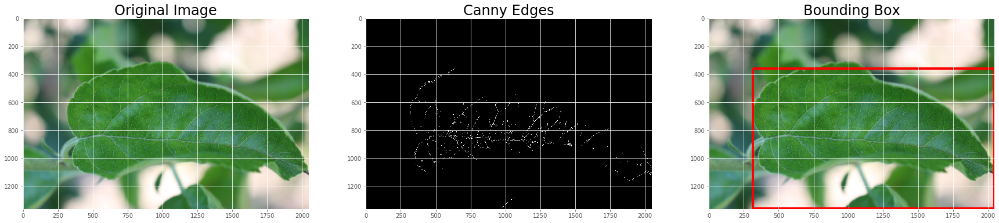

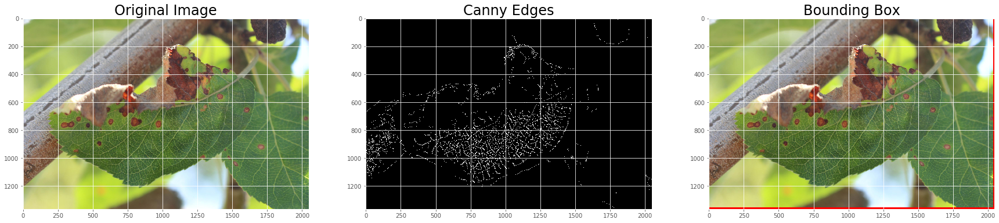

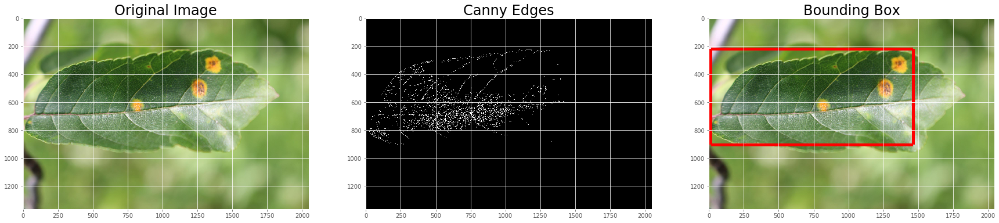

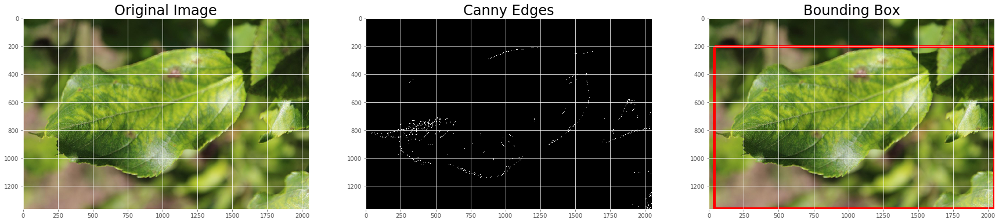

In [19]:
edge_and_cut(train_images[healthy_ids[0]])
edge_and_cut(train_images[multiple_disease_ids[0]])
edge_and_cut(train_images[rust_ids[0]])
edge_and_cut(train_images[scab_ids[0]])


### Convolution with different filters

In [20]:
#Let 's try applyting different kernels for the convolution

# construct average blurring kernels used to smooth an image
smallBlur = np.ones((7, 7), dtype="float") * (1.0 / (7 * 7))
largeBlur = np.ones((21, 21), dtype="float") * (1.0 / (21 * 21))

# construct a sharpening filter
sharpen = np.array(([0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]), dtype="int")

# construct the Laplacian kernel used to detect edge-like
# regions of an image
laplacian = np.array(([0, 1, 0],
                      [1, -4, 1],
                      [0, 1, 0]), dtype="int")

# construct the Sobel x-axis kernel
sobelX = np.array(([-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]), dtype="int")

# construct the Sobel y-axis kernel
sobelY = np.array(([-1, -2, -1],
                   [0, 0, 0],
                   [1, 2, 1]), dtype="int")

In [21]:
# construct the kernel bank, a list of kernels we're going
# to apply using both our custom `convole` function and
# OpenCV's `filter2D` function
kernel_bank = (
("small_blur", smallBlur),
("large_blur", largeBlur),
("sharpen", sharpen),
("laplacian", laplacian),
("sobel_x", sobelX),
("sobel_y", sobelY)
)

In [22]:
def conv_kernel(img_list, kernel):
    for i in range(len(img_list)):
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,15))
        conv = cv2.filter2D(img_list[i], -1, kernel[1])
        ax[0].imshow(img_list[i])
        ax[0].grid(False)
        ax[0].set_title('Original Image', fontsize=10)
        ax[1].imshow(conv)
        ax[1].grid(False)
        ax[1].set_title(kernel[0] + ' filtered image', fontsize=10)
        plt.show()

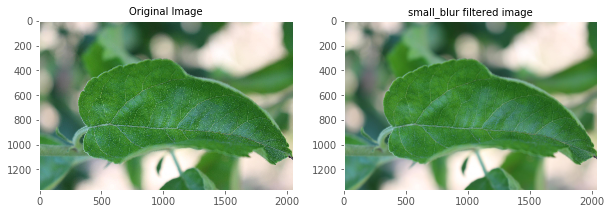

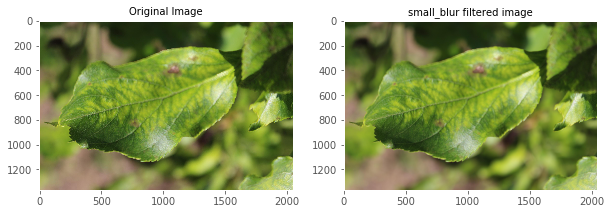

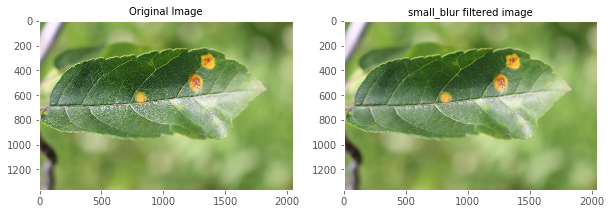

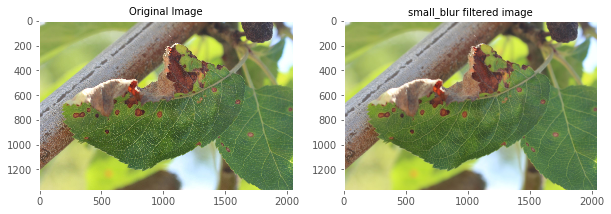

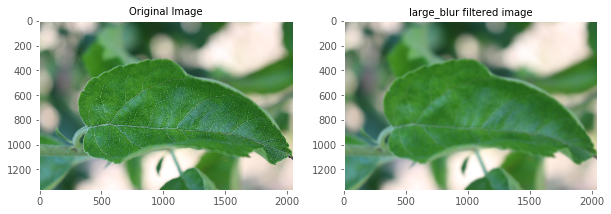

...

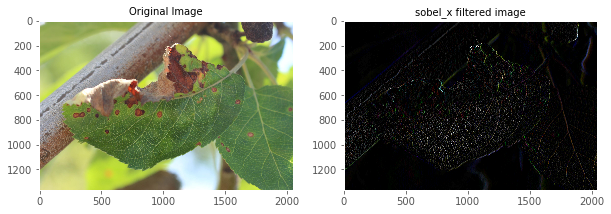

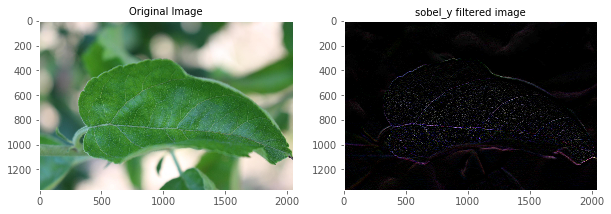

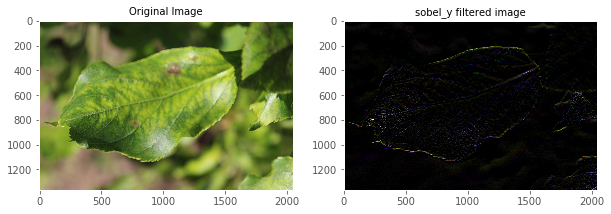

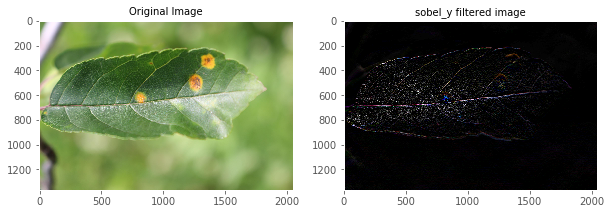

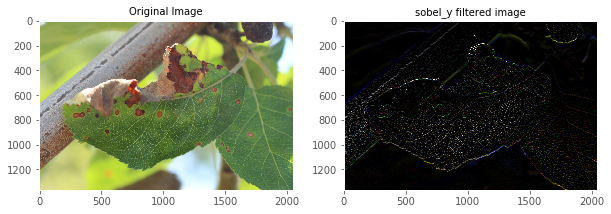

[None, None, None, None, None, None]

In [23]:
# We apply the convolution and show a list of images for reference.
list_images = [train_images[healthy_ids[0]],train_images[scab_ids[0]],
               train_images[rust_ids[0]],train_images[multiple_disease_ids[0]]]
[conv_kernel(list_images,kernel) for kernel in kernel_bank]

### Modeling

In [66]:
#We define a function to draw the metrics for the network performance
def plot_metric(history, metric):
    history_dict = history.history
    values = history_dict[metric]
    if 'val_' + metric in history_dict.keys():  
        val_values = history_dict['val_' + metric]

    epochs = range(1, len(values) + 1)

    if 'val_' + metric in history_dict.keys():  
        plt.plot(epochs, val_values, label='Validation')
    plt.semilogy(epochs, values, label='Training')

    if 'val_' + metric in history_dict.keys():  
        plt.title('Training and validation %s' % metric)
    else:
        plt.title('Training %s' % metric)
    plt.xlabel('Epochs')
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid()

    plt.show() 

In [46]:
img_size = 150

In [42]:
train_images_arr = [cv2.resize(image,(img_size,img_size),interpolation=cv2.INTER_AREA) for image in train_images]

list

In [44]:
test_images_arr = [cv2.resize(image,(img_size,img_size),interpolation=cv2.INTER_AREA) for image in test_images]

In [63]:
#shape the training images to work for keras.
X_train = np.asarray(train_images_arr, dtype=np.float32)
X_train = X_train/255

print(X_train.shape)

X_test = np.asarray(test_images_arr, dtype=np.float32)
X_test = X_test/255

print(X_test.shape)

target = ['healthy','scab','rust','multiple_diseases']
y = train_data[target][:SAMPLE_LEN]
y_train = np.array(y.values, dtype='float32')
print(y_train.shape,y_train[0])


(100, 150, 150, 3)
(10, 150, 150, 3)
(100, 4) [0. 1. 0. 0.]


In [64]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten, Input
from keras.optimizers import SGD, Adam
from keras.utils import np_utils
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
# resplit and shape the data again. the data to get a clean set.
X_train, X_val, y_train, y_val = train_test_split(X_train, 
                                                  y_train, 
                                                  test_size = 0.20, 
                                                  random_state = 403 )

In [65]:
#use the sequential model
cnn = Sequential()
I = Input(shape=(img_size, img_size, 3))
#add aconvolutional layer
cnn.add(Conv2D(25, kernel_size = (5,5), strides = (1,1), 
               padding = 'same',
               activation = 'relu',
               input_shape = (img_size, img_size, 3)
              )
       )

cnn.add(Conv2D(75, kernel_size = (5,5), strides = (1,1),
               padding = 'same',
               activation = 'relu',
               input_shape = (img_size, img_size, 3)
              )
       )
cnn.add(MaxPool2D(pool_size=(4,4)))
cnn.add(Dropout(0.25))

cnn.add(Conv2D(150, kernel_size = (3,3), strides = (1,1),
               padding = 'same',
               activation = 'relu',
               input_shape = (img_size, img_size, 3)
              )
       )
cnn.add(MaxPool2D(pool_size=(2,2)))
cnn.add(Dropout(0.25))

cnn.add(Flatten())

cnn.add(Dense(300, activation='relu'))
cnn.add(Dropout(0.35))
cnn.add(Dense(150, activation='relu'))
cnn.add(Dropout(0.25))
# output layer
cnn.add(Dense(4, activation='softmax'))

optimizer_1 = Adam(lr=0.001)
optimizer_2 = SGD(lr=0.01)

cnn.compile(loss="categorical_crossentropy", optimizer=optimizer_1, metrics=["accuracy"])

In [67]:
cnn.fit(X_train,
        y_train,
        batch_size = 32,
        epochs = 5,
        validation_data = (X_val,y_val))

Train on 80 samples, validate on 20 samples
Epoch 1/5
80/80 [==============================] - 11s 136ms/step - loss: 3.2173 - accuracy: 0.4250 - val_loss: 1.2572 - val_accuracy: 0.4000
Epoch 2/5
80/80 [==============================] - 11s 142ms/step - loss: 1.3865 - accuracy: 0.3375 - val_loss: 1.3611 - val_accuracy: 0.3500
Epoch 3/5
80/80 [==============================] - 12s 154ms/step - loss: 1.3039 - accuracy: 0.4000 - val_loss: 1.3300 - val_accuracy: 0.3000
Epoch 4/5
80/80 [==============================] - 12s 147ms/step - loss: 1.3329 - accuracy: 0.2875 - val_loss: 1.3153 - val_accuracy: 0.3000
Epoch 5/5
80/80 [==============================] - 12s 149ms/step - loss: 1.3006 - accuracy: 0.3375 - val_loss: 1.3479 - val_accuracy: 0.3000
